In [1]:
import osmnx as ox
import networkx as nx

# this is for all the utilities that ease our
# usage of networkx/osmnx and the wrapper around
# folium/ipyleaflet -- see its tutorial for more details
from utilities import * 

Using [`osmnx.graph_from_address`](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.graph.graph_from_address) to turn textual description of place to `networkx` graph of that place map

In [2]:
G_big = ox.graph_from_address("university of toronto")

This is multidigraph to handle two ways street and complex graph networks

In [3]:
type(G_big)

networkx.classes.multidigraph.MultiDiGraph

Visualize that graph using matplotlib

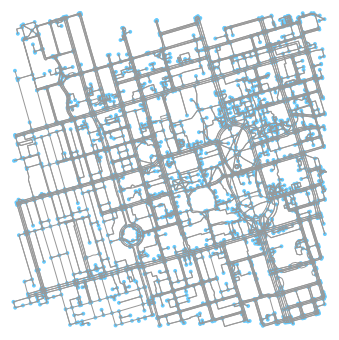

In [4]:
fig, ax = ox.plot_graph(G_big)

so much nodes right?

Visualize graph nodes with folium

In [5]:
ox.plot_graph_folium(G_big)

It also has functionality for plotting routes [`ox.plot_route_folium`](https://osmnx.readthedocs.io/en/stable/osmnx.html?highlight=folium#osmnx.folium.plot_route_folium) that takes a graph and list of nodes

**BUT**, this black and white map isn't cool enough for us to use right? we want to see where is the water and where is the dry land, etc.

We could use that type of maps, but it is relatively inefficient on large graphs >=1200 nodes or something. Folium provides that kind of maps and ipyleaflet does the same but it is not used in `osmnx` for efficiency purposes.

We have made a wrapper around all of these functions from ipyleaflet and folium (colored/black and white) in `/Utilities/utils/viz.py` that can know the size of the graph and act accordingly, and also don't forget the issue of google colab from the README.

Let's prune the graph a bit by changing the width of our scope, and use our wrapper

In [6]:
G_small = ox.graph_from_address("university of toronto", dist = 300)

In [7]:
len(G_small)

397

In [8]:
# the wrapper around folium and ipyleaflet
draw_map(G_small)

Map(center=[43.6631656, -79.3979318], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_titl…

In [9]:
draw_map(G_big)

The graph has 3464 which is a lot, we will use basic faster folium instead


let's see the nodes with their osm ids

In [10]:
G_small.nodes()

NodeView((130170945, 2557542523, 2557542526, 2143404200, 2143404199, 306725181, 306725184, 2498969982, 2498969984, 340165033, 390545921, 60654119, 60654120, 60654129, 774054381, 389677890, 389677891, 389677892, 389677893, 389677894, 389677896, 389677901, 389677902, 389677903, 389677904, 389677905, 389677906, 389677907, 389678001, 389678002, 389678003, 389678004, 389678005, 389678007, 389678008, 389678009, 389678012, 389678013, 389678015, 389678016, 389678025, 389678026, 389678027, 389678028, 389678029, 389678032, 389678033, 389678034, 389678036, 389678037, 389678054, 389678111, 389678112, 389678113, 389678122, 389678121, 389678124, 389678145, 389678146, 389678150, 389678151, 389678157, 389678158, 389678159, 389678160, 389678162, 389678161, 389678172, 389678174, 389678175, 389678176, 389678177, 389678180, 389678181, 389678182, 389678185, 389678186, 389678187, 389678188, 389678189, 389678190, 389678191, 389678192, 389678194, 389678195, 389678197, 389678200, 389678201, 389678202, 38967820

We can refer to the node from the graph like that

In [11]:
G_small[2143485664] 

AdjacencyView({2143485662: {0: {'osmid': 204343769, 'lanes': '2', 'highway': 'service', 'access': 'permissive', 'oneway': False, 'length': 26.756, 'geometry': <shapely.geometry.linestring.LineString object at 0x7fc5f0415eb8>}}})

In [12]:
G_small[2143485662]

AdjacencyView({2143485660: {0: {'osmid': 13741293, 'lanes': '2', 'name': 'Tower Road', 'highway': 'service', 'access': 'permissive', 'oneway': False, 'length': 26.048}}, 4920594802: {0: {'osmid': 13741293, 'lanes': '2', 'name': 'Tower Road', 'highway': 'service', 'access': 'permissive', 'oneway': False, 'length': 27.297}}, 2143485664: {0: {'osmid': 204343769, 'lanes': '2', 'highway': 'service', 'access': 'permissive', 'oneway': False, 'length': 26.756, 'geometry': <shapely.geometry.linestring.LineString object at 0x7fc5f0415e80>}}})

You will see dictionary structure containing the incident nodes which itself is another dictionary containing another osmid which is the id of the way/relation that group the two nodes together.

The rest of the data in the dictionary are pretty self-explanatory 

---

we want to highlight these nodes 2143485664 and 2143485662 to see them on the actual graph

In [13]:
highlighted = [2143485664, 2143485662]

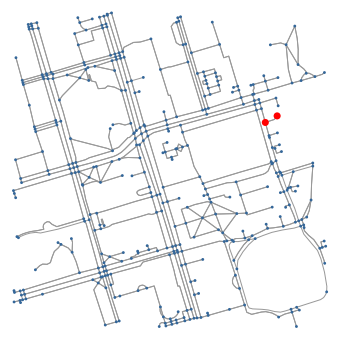

In [14]:
# with matplotlib
# we need a list of colors for all the nodes
# and we can change the size of the actual node
nc = ['r' if node in highlighted else '#336699' for node in G_small.nodes()]
ns = [50 if node in highlighted else 8 for node in G_small.nodes()]
fig, ax = ox.plot_graph(G_small, node_size=ns, node_color=nc, node_zorder=2)

In [15]:
# with the wrapper around ipyleaflet or folium
draw_map(G = G_small, highlight = highlighted)

Map(center=[43.6631656, -79.3979318], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_titl…

let's get a route a see what can we do about it

In [16]:
# for sure we won't use this method anymore
# we will implement all these algorithms from scratch
route = nx.shortest_path(G_small, 306721038, 127284680)

In [17]:
route

[306721038,
 771950969,
 306725181,
 24959546,
 390545070,
 2078205535,
 389678008,
 21631731,
 389678033,
 389678034,
 389677904,
 3996671926,
 389677905,
 130170945,
 127284680]

In [18]:
draw_route(G_small, route)

Map(center=[43.6631656, -79.3979318], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_titl…